# Import Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import lime
import lime.lime_tabular

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.linear_model import Lasso, Ridge, LinearRegression
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold, RandomizedSearchCV
from matplotlib.lines import Line2D

# Load and prepare data

In [2]:
data = pd.read_csv('insurance.csv',sep=',',na_values=np.nan)

# Binary encoding for 'sex' and 'smoker'
data['sex'] = data['sex'].map({'male': 1, 'female': 0})
data['smoker'] = data['smoker'].map({'yes': 1, 'no': 0})

# One-hot encoding for 'region'
data_encoded = pd.get_dummies(data, columns=['region'], drop_first=True)

# Checking if transformation was successful
data.head()

,age,sex,bmi,children,smoker,region,charges
0,19,0,27.900,0,1,southwest,16884.92400
1,18,1,33.770,1,0,southeast,1725.55230
2,28,1,33.000,3,0,southeast,4449.46200
3,33,1,22.705,0,0,northwest,21984.47061
4,32,1,28.880,0,0,northwest,3866.85520


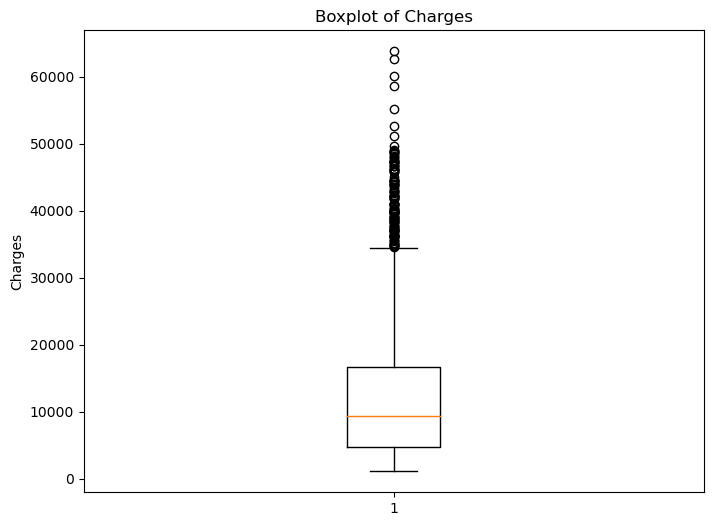

In [3]:
# Create a boxplot for 'charges' to see if we have a lot of outliers and maybe address the issue
plt.figure(figsize=(8, 6))
plt.boxplot(data['charges'])
plt.title('Boxplot of Charges')
plt.ylabel('Charges')
plt.show()

In [4]:
#As we have a lot of outlier we decide to proceed with a log transformation of 'charges' to limit the effect of those outliers
data['charges'] = np.log(data['charges'])

data.head()

,age,sex,bmi,children,smoker,region,charges
0,19,0,27.900,0,1,southwest,9.734176
1,18,1,33.770,1,0,southeast,7.453302
2,28,1,33.000,3,0,southeast,8.400538
3,33,1,22.705,0,0,northwest,9.998092
4,32,1,28.880,0,0,northwest,8.260197


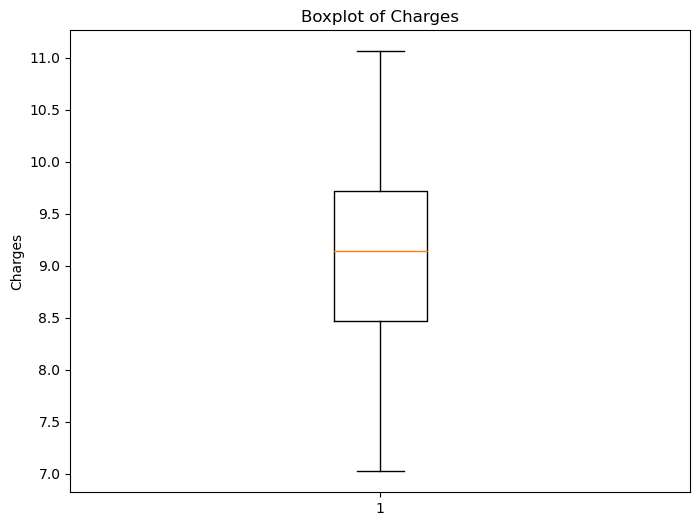

In [5]:
# Create a boxplot for 'charges'
plt.figure(figsize=(8, 6))
plt.boxplot(data['charges'])
plt.title('Boxplot of Charges')
plt.ylabel('Charges')
plt.show()

We can observe that now we don't have anymore outliers in 'charges' after the log transformation

# Create the training, validation and test sets

In [6]:
# Define independent variables (features) and dependent variable (target)
X_encoded = data_encoded.drop('charges', axis=1)
y_encoded = data_encoded['charges']

# Split the data into training, validation, and test sets
X_train_enc, X_temp_enc, y_train_enc, y_temp_enc = train_test_split(X_encoded, y_encoded, test_size=0.3, random_state=42)
X_val_enc, X_test_enc, y_val_enc, y_test_enc = train_test_split(X_temp_enc, y_temp_enc, test_size=1/3, random_state=42)

X_train_enc.describe()
y_train_enc.describe()

count      936.000000
mean     13379.157307
std      12108.882855
min       1121.873900
25%       4819.842913
50%       9526.937700
75%      17222.181875
max      62592.873090
Name: charges, dtype: float64

# Define important parameters and functions

In [7]:
tau = 0.75
pinball_losses = {}

# Function to calculate the pinball loss
def calculate_pinball_loss(y_true, y_pred, tau):
    delta = y_true - y_pred
    return np.maximum(tau * delta, (tau - 1) * delta).mean()

def train_and_evaluate(model, X_train, y_train, X_val, y_val):
    # Train the model
    model.fit(X_train, y_train)

    # Predict on the validation set
    y_pred = model.predict(X_val)

    # Calculate and return the mean squared error
    mse = mean_squared_error(y_val, y_pred)
    return mse

# Qunatile Regression

In [8]:
# Add a constant to the model (intercept)
X_train_sm_enc = sm.add_constant(X_train_enc)
X_val_sm_enc = sm.add_constant(X_val_enc)

# Define the quantile for the regression
quantile = 0.75

# Fit the quantile regression model
model_enc = sm.QuantReg(y_train_enc, X_train_sm_enc)
results_enc = model_enc.fit(q=quantile)

# Predict on the validation set
y_pred_val_enc = results_enc.predict(X_val_sm_enc)

# Calculate the pinball loss for the validation set
pinball_loss_val_enc = calculate_pinball_loss(y_val_enc,  y_pred_val_enc, quantile)
pinball_losses["Quantile Regression"] = pinball_loss_val_enc
mse_val_qr = mean_squared_error(y_val_enc, y_pred_val_enc)
print(f'Pinball Loss on Validation Set: {pinball_loss_val_enc}')

Pinball Loss on Validation Set: 1334.2047569344802


# Gradient Boost with Pinball loss

In [9]:
# Function to train a Gradient Boosting model with quantile loss
def train_gradient_boosting_model(X_train, y_train, quantile):
    gbr = GradientBoostingRegressor(loss='quantile', alpha=quantile, random_state=42)
    gbr.fit(X_train, y_train)
    return gbr

# Define the quantile for the regression
quantile = 0.75

# Train the Gradient Boosting model
gbr_model = train_gradient_boosting_model(X_train_enc, y_train_enc, quantile)

# Predict on the validation set
y_pred_val_gbr = gbr_model.predict(X_val_enc)

# Calculate the pinball loss for the validation set
pinball_loss_val_gbr = calculate_pinball_loss(y_val_enc, y_pred_val_gbr, quantile)
pinball_losses["Gradient Boost"] = pinball_loss_val_gbr
mse_val_gbr = mean_squared_error(y_val_enc, y_pred_val_gbr)
pinball_loss_val_gbr

937.5909640394888

# Other model Comparison
We look at other models in order to compare them and see which one is the most capable of adressing our problem. All the following model use L2 as loss for their training, compared to the pinball loss (0.75) for the two previous models

In [10]:
# Lasso Regression
lasso_model = Lasso(random_state=42)
lasso_mse = train_and_evaluate(lasso_model, X_train_enc, y_train_enc, X_val_enc, y_val_enc)
y_pred_lasso = lasso_model.predict(X_val_enc)
pinball_losses["Lasso"] = calculate_pinball_loss(y_val_enc, y_pred_lasso, tau)
print("Lasso MSE:", lasso_mse)

# Ridge Regression
ridge_model = Ridge(random_state=42)
ridge_mse = train_and_evaluate(ridge_model, X_train_enc, y_train_enc, X_val_enc, y_val_enc)
y_pred_ridge = ridge_model.predict(X_val_enc)
pinball_losses["Ridge"] = calculate_pinball_loss(y_val_enc, y_pred_ridge, tau)
print("Ridge MSE:", ridge_mse)

# Extra Trees Regressor
extra_trees_model = ExtraTreesRegressor(random_state=42)
extra_trees_mse = train_and_evaluate(extra_trees_model, X_train_enc, y_train_enc, X_val_enc, y_val_enc)
y_pred_extra_trees = extra_trees_model.predict(X_val_enc)
pinball_losses["Extra Trees"] = calculate_pinball_loss(y_val_enc, y_pred_extra_trees, tau)
print("Extra Trees MSE:", extra_trees_mse)

# Random Forest Regressor
random_forest_model = RandomForestRegressor(random_state=42)
random_forest_mse = train_and_evaluate(random_forest_model, X_train_enc, y_train_enc, X_val_enc, y_val_enc)
y_pred_random_forest = random_forest_model.predict(X_val_enc)
pinball_losses["Random Forest"] = calculate_pinball_loss(y_val_enc, y_pred_random_forest, tau)
print("Random Forest MSE:", random_forest_mse)

#Simple Tree 
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train_enc, y_train_enc)
# Predict on the validation set
y_pred_tree = tree_model.predict(X_val_enc)
# Calculate MSE for the Decision Tree model
pinball_losses["Simple Tree"] = calculate_pinball_loss(y_val_enc, y_pred_tree, tau)
tree_mse = mean_squared_error(y_val_enc, y_pred_tree)
print("Simple Tree:", tree_mse)

Lasso MSE: 31779741.569220338
Ridge MSE: 31840114.349183775
Extra Trees MSE: 23686255.957593534
Random Forest MSE: 20237881.896432165
Simple Tree: 40502571.77172611


# Performance Measure plotting to select the most suitable model 

In [11]:
# Function for Pinball Loss
def pinball_loss(y_true, y_pred, tau):
    delta = y_true - y_pred
    return np.maximum(tau * delta, (tau - 1) * delta).mean()

# Function for Asymmetric MSE
def asymmetric_mse(y_true, y_pred, underestimation_weight):
    error = y_pred - y_true
    weighted_error = np.where(error < 0, underestimation_weight * error ** 2, error ** 2)
    return np.mean(weighted_error)

# Function for Worst-case Error
def worst_case_error(y_true, y_pred):
    error = y_pred - y_true
    return np.min(error)

# Assuming you have a list of models and their predictions
models = ['Quantile Regression', 'Gradient Boost', 'Lasso', 'Ridge', 'Extra Tree', 'Random Forest', 'Simple Tree']
predictions = [y_pred_val_enc, y_pred_val_gbr, y_pred_lasso, y_pred_ridge, y_pred_extra_trees, y_pred_random_forest, y_pred_tree]  # Replace with actual predictions

# Calculate metrics for each model
metrics = {model: {} for model in models}
for model, y_pred in zip(models, predictions):
    metrics[model]['MSE'] = mean_squared_error(y_val_enc, y_pred)
    metrics[model]['Pinball Loss'] = pinball_loss(y_val_enc, y_pred, 0.75)
    metrics[model]['Asymmetric MSE'] = asymmetric_mse(y_val_enc, y_pred, 1.33)  # 1.33 as a similar penalty to 0.75 in pinball loss
    metrics[model]['Worst-case Error'] = worst_case_error(y_val_enc, y_pred)
    n, p = len(y_val_enc), X_train_enc.shape[1]  # Number of samples and predictors

C:\Users\micha\AppData\Local\Temp\ipykernel_8944\321903320.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(models, rotation=45)


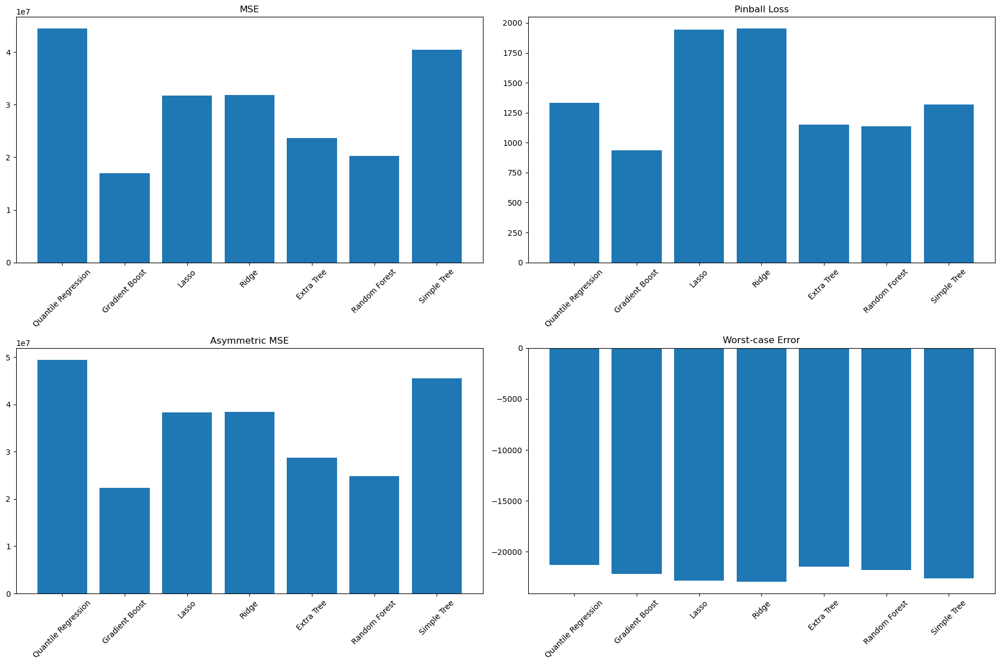

In [12]:
fig, axs = plt.subplots(2, 2, figsize=(18, 12))
for i, metric in enumerate(['MSE', 'Pinball Loss', 'Asymmetric MSE', 'Worst-case Error']):
    row, col = i // 2, i % 2
    ax = axs[row, col]
    values = [metrics[model][metric] for model in models]
    ax.bar(models, values)
    ax.set_title(metric)
    ax.set_xticklabels(models, rotation=45)

plt.tight_layout()
plt.show()

Quantile regression<br>
We can see based on the plot that the quantile regression performs the worst when it comes MSE, which is logical as it is trained using the pinball loss (0.75). However, it is still performing relatively bad compared to the other models, obtaining results similar to Lasso and Ridge for the pinball loss, although it has been trained for that. The most logical explanation is that due to the non-linearity in our data a linear model model like a quantile regression will always be to a certain degree off, as it is unable to accomodate the non-linear strcuture in the data, and thus explain why tree based models perform better. However, it is worht mentioning that it performs best for the 'Worse-case analysis', meaning that if for a company by far what they want i avoid large underestimations and are ready to be off to a certain extend, then quantile regression is perfect for that.

Gradient Boost<br>
Gradient Boost performs well in three out of the four perfomance metrics.

Other models<br>
Linear models are unable to accomodate for the non-linear structure of the data.
Tree models perform well, even for asymmetric performance metrics although they were trained with L2.

# Radar chart to get a good overall perception of the models for different performance measures

In [13]:
# Convert metrics dictionary to DataFrame for easier processing
metrics_df = pd.DataFrame(metrics).T
metrics_df.head()

# Invert the Worst-case Error if necessary
metrics_df['Worst-case Error'] = 1 / metrics_df['Worst-case Error']

# Normalize the metrics
scaler = MinMaxScaler()
normalized_metrics = scaler.fit_transform(metrics_df)
normalized_metrics_df = pd.DataFrame(normalized_metrics, index=metrics_df.index, columns=metrics_df.columns)

weights = {'MSE': 0.05, 'Pinball Loss': 0.7, 'Asymmetric MSE': 0.05, 'Worst-case Error': 0.2}

# Calculate the weighted sum for each model
normalized_metrics_df['Overall Score'] = normalized_metrics_df.mul(weights).sum(axis=1)
normalized_metrics_df.head(8)

,MSE,Pinball Loss,Asymmetric MSE,Worst-case Error,Overall Score
Quantile Regression,1.000000,0.391001,1.000000,0.000000,0.373701
Gradient Boost,0.000000,0.000000,0.000000,0.543737,0.108747
Lasso,0.538779,0.994095,0.589958,0.930335,0.938370
Ridge,0.540972,1.000000,0.593833,1.000000,0.956740
Extra Tree,0.244725,0.211428,0.234613,0.107546,0.193475
Random Forest,0.119438,0.194235,0.092075,0.320366,0.210614
Simple Tree,0.855699,0.376358,0.854208,0.808056,0.510557


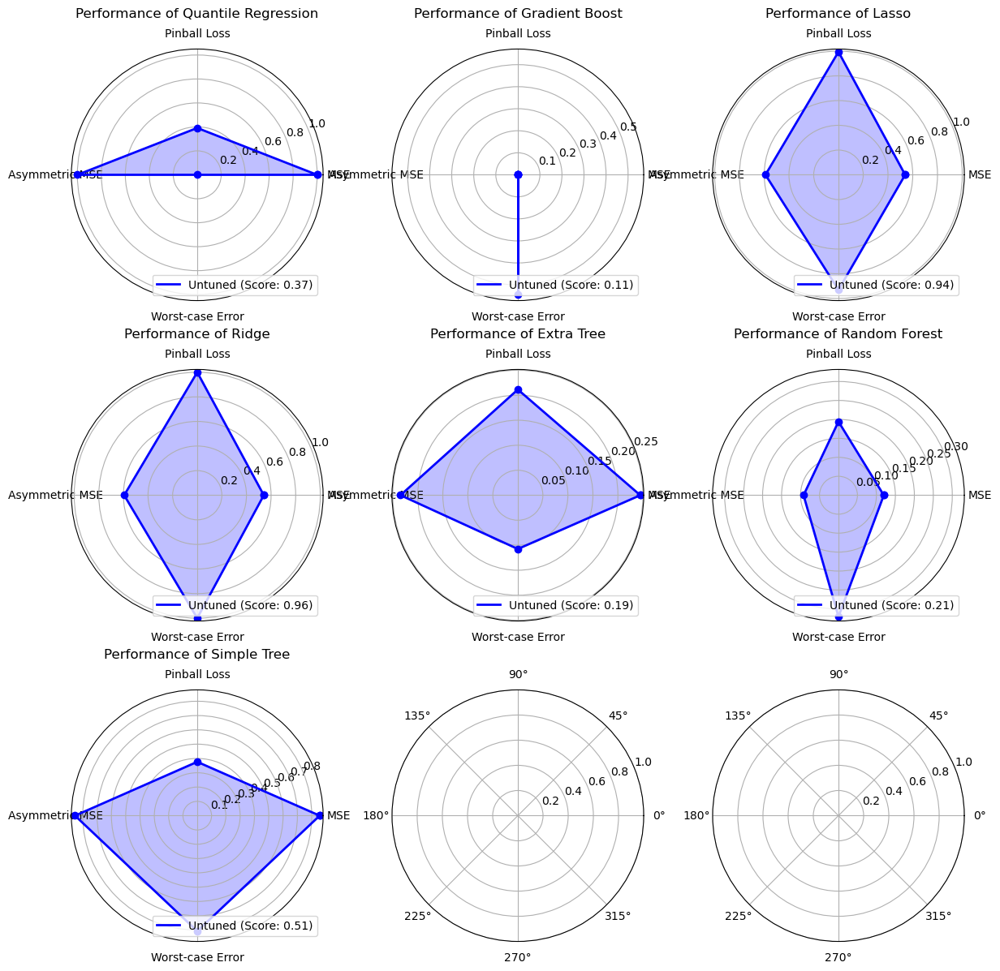

In [14]:
# Exclude 'Overall Score' from the radar chart axes
num_vars = len(normalized_metrics_df.columns) - 1  # Exclude 'Overall Score'
n_rows, n_cols = 3, 3
fig, axs = plt.subplots(n_rows, n_cols, figsize=(12, 12), subplot_kw=dict(polar=True))
fig.subplots_adjust(hspace=0.5)

# Flatten the axs array for easy iteration
axs = axs.flatten()

# Iterate over models and plot each radar chart
for i, model_name in enumerate(normalized_metrics_df.index):
    ax = axs[i]
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    # Values for untuned model, excluding 'Overall Score'
    values = normalized_metrics_df.loc[model_name].drop('Overall Score').tolist()
    values += values[:1]
    ax.plot(angles, values, 'o-', linewidth=2, color='blue')
    ax.fill(angles, values, alpha=0.25, color='blue')

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(normalized_metrics_df.columns.drop('Overall Score'), rotation=90)
    ax.set_title(f"Performance of {model_name}", y=1.1)

    # Add legend with overall scores
    overall_score = normalized_metrics_df.loc[model_name, 'Overall Score']
    legend_elements = [
        Line2D([0], [0], color='blue', lw=2, label=f'Untuned (Score: {overall_score:.2f})'),
    ]
    ax.legend(handles=legend_elements, loc='lower right', fontsize=10)

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()

Based on these results we clearly see that Gradient Boost is the best performing model. Followed closely, by the extra trees and random forest. 
We decide to proceed further with the best performing models and the quantile regression, as it showed to be very useful if worse-cases are a big issue for the given company. 

To calculate the overllscore we multiply the standardised performance on each metric (value from 0 to 1) and multiply is with the weights, which are 'MSE': 0.05, 'Pinball Loss': 0.7, 'Asymmetric MSE': 0.05 and 'Worst-case Error': 0.2. We give significantly more wieght to Pinball loss and Wort-case error, as those are the errors we want to minimize.
The model with the lowest score is the one that performs overall the best. 


# Model tuning

## Quantile Regression

In [15]:
# Add a constant to the model (intercept)
X_train_sm_enc = sm.add_constant(X_train_enc)
X_val_sm_enc = sm.add_constant(X_val_enc)  # Prepare the validation set

# Define the quantile for the regression
quantile = 0.75

# Initialize KFold
kf = KFold(n_splits=10, shuffle=True, random_state=42) #change K 

# Lists to store results for each fold
mse_scores_cv = []
pinball_losses_cv = []

# List to store predictions for the specific validation set
y_pred_val_all = []

for train_index, _ in kf.split(X_train_sm_enc, y_train_enc):
    # Split data into training (ignore the test part of each fold)
    X_train_fold, y_train_fold = X_train_sm_enc.iloc[train_index], y_train_enc.iloc[train_index]

    # Fit the quantile regression model
    model_enc = sm.QuantReg(y_train_fold, X_train_fold)
    results_enc = model_enc.fit(q=quantile)

    # Predict on the specific validation set
    y_pred_val_fold = results_enc.predict(X_val_sm_enc)
    y_pred_val_all.append(y_pred_val_fold)

    # Calculate and store MSE and pinball loss for the fold on the validation set
    mse_val_fold = mean_squared_error(y_val_enc, y_pred_val_fold)
    pinball_loss_val_fold = calculate_pinball_loss(y_val_enc, y_pred_val_fold, 0.75)
    
    mse_scores_cv.append(mse_val_fold)
    pinball_losses_cv.append(pinball_loss_val_fold)

# Calculate average MSE and pinball loss across all folds for the validation set
average_mse_cv = np.mean(mse_scores_cv)
average_pinball_loss_cv = np.mean(pinball_losses_cv)

print(f"Average MSE across folds on Validation Set: {average_mse_cv}")
print(f"Average Pinball Loss across folds on Validation Set: {average_pinball_loss_cv}")

# Aggregate predictions from all folds for the validation set
y_pred_val_aggregated = np.mean(y_pred_val_all, axis=0)

Average MSE across folds on Validation Set: 44563249.63956296
Average Pinball Loss across folds on Validation Set: 1334.6157259921758


We obtain worse results when tuning for cross validation with k = 10, but with cross-validation we mitigate the risk of overfitting which can be present with a single train-test

## Gradient Boost

In [16]:
def pinball_loss_scorer(y_true, y_pred):
    quantile = 0.75  # Define the quantile here if it's fixed
    return calculate_pinball_loss(y_true, y_pred, quantile)

def train_gradient_boosting_model(X_train, y_train, quantile, X_val, y_val):
    # Define the model
    gbr = GradientBoostingRegressor(loss='quantile', alpha=quantile, random_state=42)

    # Define hyperparameter search space
    param_dist = {
        'n_estimators': [100, 200, 300, 400, 500],  # Example range, adjust as needed
        'learning_rate': [0.01, 0.05, 0.1, 0.2],   # Example range
        'max_depth': [3, 4, 5, 6, 7],              # Example range
        'min_samples_leaf': range(4, 11)           # Range from 5 to 10
    }

    # Custom scorer for pinball loss
    scorer = make_scorer(pinball_loss_scorer, greater_is_better=False)

    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(estimator=gbr, param_distributions=param_dist, 
                                       n_iter=20, scoring=scorer, cv=5, random_state=42) #change n_iter 

    # Fit the model
    random_search.fit(X_train, y_train)

    # Best model
    best_gbr = random_search.best_estimator_

    # Predict on validation set using best model
    y_pred_val = best_gbr.predict(X_val)

    # Return the best model and predictions
    return best_gbr, y_pred_val

# Using the function to train and validate the model
gbr_model, y_pred_val_gbrt = train_gradient_boosting_model(X_train_enc, y_train_enc, quantile, X_val_enc, y_val_enc)

# Calculate the pinball loss for the validation set
pinball_loss_val_gbr = calculate_pinball_loss(y_val_enc, y_pred_val_gbrt, 0.75)

# Output the results
print(f"Best Gradient Boosting Model based on Pinball Loss: {gbr_model}")
print(f"Pinball Loss: {pinball_loss_val_gbr}")
mse_val_gbr = mean_squared_error(y_val_enc, y_pred_val_gbrt)
print(mse_val_gbr)

Best Gradient Boosting Model based on Pinball Loss: GradientBoostingRegressor(alpha=0.75, loss='quantile', min_samples_leaf=5,
                          n_estimators=200, random_state=42)
Pinball Loss: 962.112605698459
17723464.865585513


We tune Gradient boost for hyperparameters using a random searhc grid with 20 iterations: number of estimators, learning rate, max depth and minimal samples per leaf. The objective is to refine the predictions of our model, but at the same time we are mitigating overfitting risk as it is our main concern. 

## Extra Tree

In [17]:
def train_and_evaluate_with_random_search(X_train, y_train, X_val, y_val):
    # Define the model
    extra_trees = ExtraTreesRegressor(random_state=42)

    # Define hyperparameter search space
    param_dist = {
        'n_estimators': [100, 200, 300, 400, 500],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_leaf': range(4, 11),
        'max_features': ['sqrt', 'log2']  # Removed 'auto', added None
    }

    # Custom scorer for MSE
    scorer = make_scorer(mean_squared_error, greater_is_better=False)

    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(estimator=extra_trees, param_distributions=param_dist, 
                                       n_iter=20, scoring=scorer, cv=5, random_state=42)

    # Fit the model
    random_search.fit(X_train, y_train)

    # Best model
    best_extra_trees = random_search.best_estimator_

    # Predict on validation set using best model
    y_pred_val = best_extra_trees.predict(X_val)

    # Manually adjust predictions by 2% to address underestimation
    y_pred_val_adjusted = y_pred_val * 1.02

    # Calculate the MSE for the adjusted predictions
    mse_val_adjusted = mean_squared_error(y_val, y_pred_val_adjusted)

    return best_extra_trees, mse_val_adjusted, y_pred_val_adjusted

# Using the function to train and validate the model
best_extra_trees, best_mse_adjusted, y_pred_val_extra_treet = train_and_evaluate_with_random_search(X_train_enc, y_train_enc, X_val_enc, y_val_enc)

# Output the results
print(f"Best Extra Trees Model: {best_extra_trees}")
print(f"Adjusted MSE: {best_mse_adjusted}")
pinball_loss_extra_tree = calculate_pinball_loss(y_val_enc, y_pred_val_extra_treet, 0.75)
print(f"Pinball Loss: {pinball_loss_extra_tree}")

Best Extra Trees Model: ExtraTreesRegressor(max_depth=40, max_features='log2', min_samples_leaf=4,
                    random_state=42)
Adjusted MSE: 23597425.53776062
Pinball Loss: 1478.0581496234493


We tune Extra Tree for hyperparameters using a random searhc grid with 20 iterations: number of estimators, max depth,  minimal samples per leaf and maximum number of features considered at each split. The objective is to refine the predictions of our model, but at the same time we are mitigating overfitting risk as it is our main concern. 

## Random Forest

In [18]:
def train_and_evaluate_with_random_search_rf(X_train, y_train, X_val, y_val):
    # Define the model
    random_forest = RandomForestRegressor(random_state=42)

    # Define hyperparameter search space
    param_dist = {
        'n_estimators': [100, 200, 300, 400, 500],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_leaf': range(4, 11),
        'max_features': ['sqrt', 'log2']  # Options for Random Forest
    }

    # Custom scorer for MSE
    scorer = make_scorer(mean_squared_error, greater_is_better=False)

    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(estimator=random_forest, param_distributions=param_dist, 
                                       n_iter=20, scoring=scorer, cv=5, random_state=42) #change n_iter

    # Fit the model
    random_search.fit(X_train, y_train)

    # Best model
    best_random_forest = random_search.best_estimator_

    # Predict on validation set using best model
    y_pred_val = best_random_forest.predict(X_val)

    # Manually adjust predictions by 2% to address underestimation
    y_pred_val_adjusted = y_pred_val * 1.02

    # Calculate the MSE for the adjusted predictions
    mse_val_adjusted = mean_squared_error(y_val, y_pred_val_adjusted)

    return best_random_forest, mse_val_adjusted, y_pred_val_adjusted

# Using the function to train and validate the model
best_model_rf, best_mse_adjusted_rf, y_pred_val_random_forestt = train_and_evaluate_with_random_search_rf(X_train_enc, y_train_enc, X_val_enc, y_val_enc)

# Output the results
print(f"Best Random Forest Model: {best_model_rf}")
print(f"Adjusted MSE: {best_mse_adjusted_rf}")
pinball_loss_random_forest = calculate_pinball_loss(y_val_enc, y_pred_val_random_forestt, 0.75)
print(f"Pinball Loss: {pinball_loss_random_forest}")

Best Random Forest Model: RandomForestRegressor(max_features='log2', min_samples_leaf=4, n_estimators=500,
                      random_state=42)
Adjusted MSE: 19159329.896698613
Pinball Loss: 1269.684786143048


We tune Random Forest for hyperparameters using a random searhc grid with 20 iterations: number of estimators, max depth,  minimal samples per leaf and maximum number of features considered at each split. The objective is to refine the predictions of our model, but at the same time we are mitigating overfitting risk as it is our main concern. 

# Visually comapre the results to those without Hyperparameter tuning

In [19]:
# Assuming you have a list of models and their predictions
models_tuned = ['Quantile Regression', 'Gradient Boost', 'Extra Tree', 'Random Forest']
predictions_tuned = [y_pred_val_aggregated, y_pred_val_gbrt, y_pred_val_extra_treet, y_pred_val_random_forestt]

# Calculate metrics for each model
metrics_tuned = {model: {} for model in models_tuned}
for model, y_pred in zip(models_tuned, predictions_tuned):
    metrics_tuned[model]['MSE'] = mean_squared_error(y_val_enc, y_pred)
    metrics_tuned[model]['Pinball Loss'] = pinball_loss(y_val_enc, y_pred, 0.75)
    metrics_tuned[model]['Asymmetric MSE'] = asymmetric_mse(y_val_enc, y_pred, 1.33)  # Adjust the penalty as needed
    metrics_tuned[model]['Worst-case Error'] = worst_case_error(y_val_enc, y_pred)

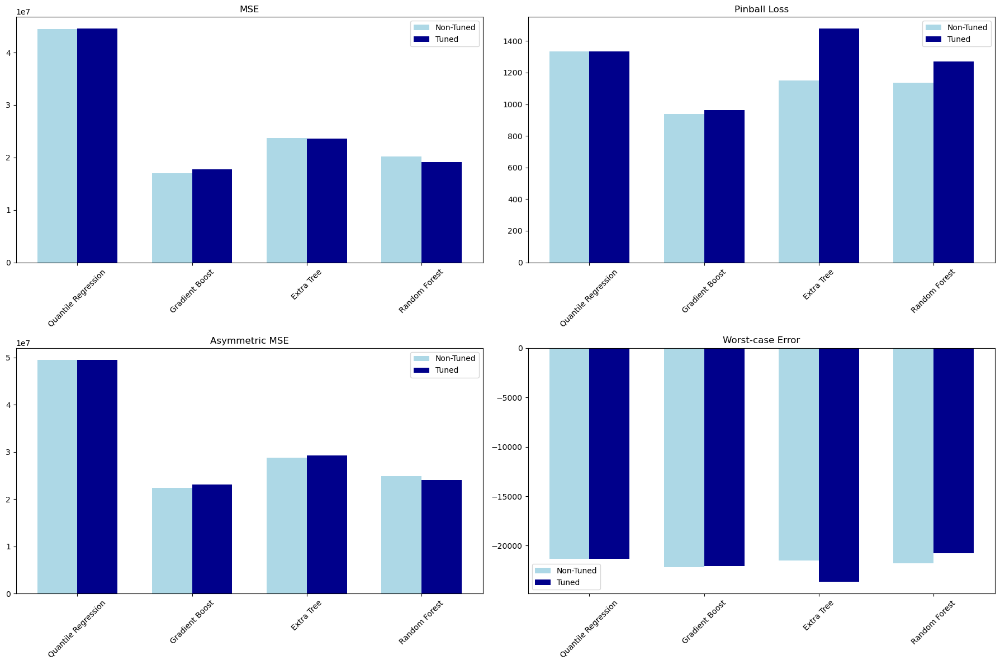

In [20]:
# Model names - ensure this list matches the models in both metrics and metrics_tuned
models = ['Quantile Regression', 'Gradient Boost', 'Extra Tree', 'Random Forest']

fig, axs = plt.subplots(2, 2, figsize=(18, 12))
metrics_list = ['MSE', 'Pinball Loss', 'Asymmetric MSE', 'Worst-case Error']

# Width of the bars in the bar plot
bar_width = 0.35

for i, metric in enumerate(metrics_list):
    ax = axs[i // 2, i % 2]
    
    # Bar locations for the current metric
    indices = range(len(models))
    
    # Values for non-tuned and tuned models
    values_non_tuned = [metrics[model][metric] for model in models]
    values_tuned = [metrics_tuned[model][metric] for model in models]
    
    # Create bar plots
    bars_non_tuned = ax.bar(indices, values_non_tuned, bar_width, label='Non-Tuned', color='lightblue')
    bars_tuned = ax.bar([index + bar_width for index in indices], values_tuned, bar_width, label='Tuned', color='darkblue')
    
    ax.set_title(metric)
    ax.set_xticks([index + bar_width / 2 for index in indices])
    ax.set_xticklabels(models, rotation=45)
    ax.legend()

plt.tight_layout()
plt.show()


Overall the tuned models performed similarly to the untuned models or a little worse. However, this is not problematic as our goal was to mitigate overfitting risk at the expense of validation performance.

# Radar Chart

In [21]:
# Drop the specified rows from the DataFrame
rows_to_drop = ['Lasso', 'Ridge', 'Simple Tree']
normalized_metrics_df = normalized_metrics_df.drop(rows_to_drop, errors='ignore')

normalized_metrics_df.head(8)

,MSE,Pinball Loss,Asymmetric MSE,Worst-case Error,Overall Score
Quantile Regression,1.000000,0.391001,1.000000,0.000000,0.373701
Gradient Boost,0.000000,0.000000,0.000000,0.543737,0.108747
Extra Tree,0.244725,0.211428,0.234613,0.107546,0.193475
Random Forest,0.119438,0.194235,0.092075,0.320366,0.210614


In [22]:
# For tuned models, repeat the same normalization and overall score calculation
metrics_df_tuned = pd.DataFrame(metrics_tuned).T  # Replace with your actual metrics for tuned models
metrics_df_tuned['Worst-case Error'] = 1 / metrics_df_tuned['Worst-case Error']
normalized_metrics_tuned = scaler.transform(metrics_df_tuned)  # Use the same scaler as for untuned models
normalized_metrics_df_tuned = pd.DataFrame(normalized_metrics_tuned, index=metrics_df_tuned.index, columns=metrics_df_tuned.columns)
#normalized_metrics_df_tuned['Overall Score'] = normalized_metrics_df_tuned.mul(weights).sum(axis=1)

normalized_metrics_df = normalized_metrics_df.drop('Overall Score', axis=1)

normalized_metrics_df_tuned.head()

,MSE,Pinball Loss,Asymmetric MSE,Worst-case Error
Quantile Regression,1.002944,0.390315,1.003254,0.017646
Gradient Boost,0.028083,0.024175,0.028724,0.490541
Extra Tree,0.241497,0.532819,0.252150,1.383000
Random Forest,0.080252,0.327394,0.062221,-0.380570


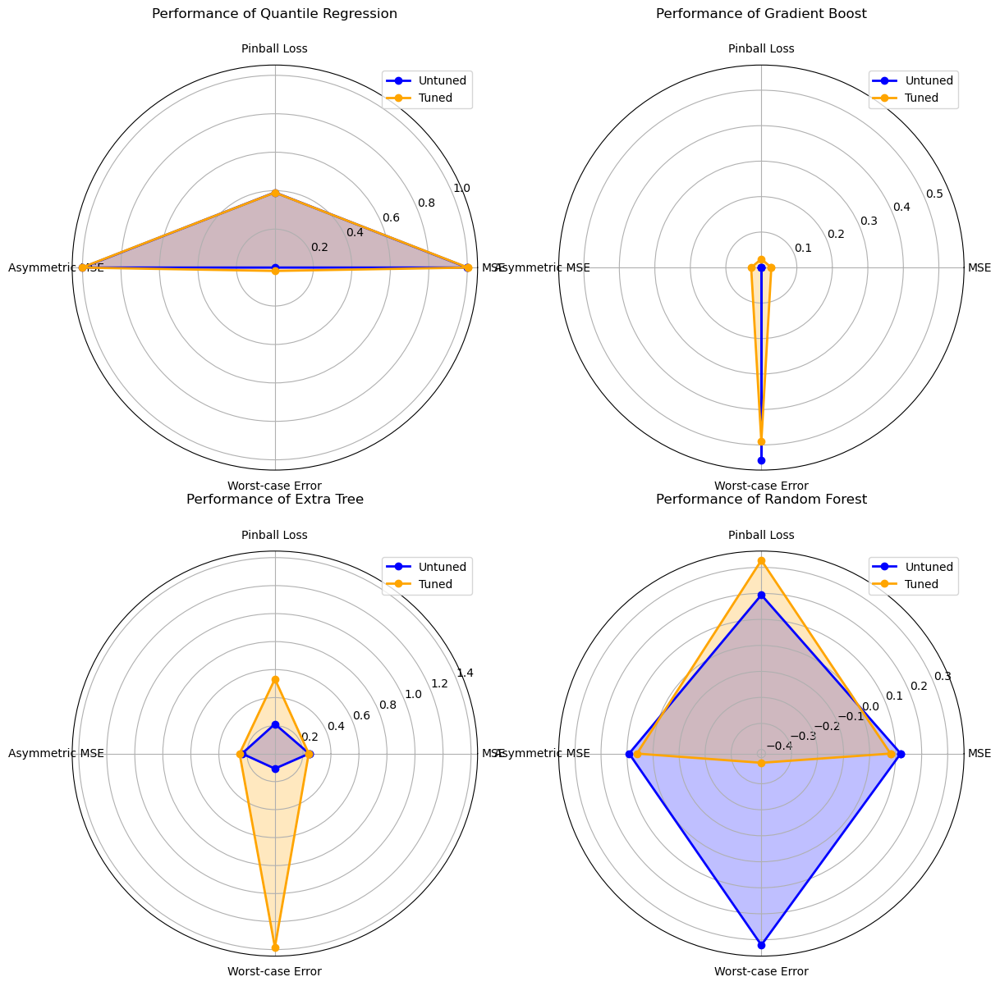

In [31]:
# Assuming 'Overall Score' is already dropped from both DataFrames
num_vars = len(normalized_metrics_df.columns)  # Number of metrics

fig, axs = plt.subplots(2, 2, figsize=(12, 12), subplot_kw=dict(polar=True))
fig.subplots_adjust(hspace=0.5)
axs = axs.flatten()  # Flatten the axs array for easy iteration

for i, model_name in enumerate(normalized_metrics_df.index):
    ax = axs[i]

    # Create angles for each metric, plus one extra to close the loop
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    # Values for the untuned model
    values_untuned = normalized_metrics_df.loc[model_name].tolist()
    values_untuned += values_untuned[:1]
    ax.plot(angles, values_untuned, 'o-', linewidth=2, label='Untuned', color='blue')
    ax.fill(angles, values_untuned, alpha=0.25, color='blue')

    # Values for the tuned model
    values_tuned = normalized_metrics_df_tuned.loc[model_name].tolist()
    values_tuned += values_tuned[:1]
    ax.plot(angles, values_tuned, 'o-', linewidth=2, label='Tuned', color='orange')
    ax.fill(angles, values_tuned, alpha=0.25, color='orange')

    # Set x-tick labels and chart title
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(normalized_metrics_df.columns)
    ax.set_title(f"Performance of {model_name}", y=1.1)
    ax.legend(loc='upper right')

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()


# Interpretability Using LIME
We now implement LIME in order to help with the interpretability of the results of our tree based models. Tree based models can yield significantly better results than standard linear models, but they are often less intuitive to understand and feel like a blackbox. As in an insurance company a lot of the employees working with clients do not have any knowledge in Machine Learning we implement LIME to give clear and concise information about the underlying reasons of a given prediction. Thus enhancing usabiltiy of the model by all employees.

In [32]:
# Get predictions from each model
predictions_gbr = gbr_model.predict(X_val_enc)
predictions_extra_trees = best_extra_trees.predict(X_val_enc)
predictions_random_forest = best_model_rf.predict(X_val_enc)

# Make sure the indices are valid for X_val_enc
lowest_pred_index = X_val_enc.index[np.argmin(predictions_gbr)]
highest_pred_index = X_val_enc.index[np.argmax(predictions_gbr)]

# Select three random indices - ensuring they are DataFrame indices
random_indices = np.random.choice(X_val_enc.index, 1, replace=False)

# Combine all selected indices
selected_indices = [lowest_pred_index, highest_pred_index] + list(random_indices)

In [33]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_enc.values,
    feature_names=X_train_enc.columns,
    mode='regression'
)

In [34]:
# Function to generate LIME explanation
def generate_lime_explanation(explainer, model, instance, feature_names):
    # Convert the instance to DataFrame to retain feature names
    instance_df = pd.DataFrame([instance], columns=feature_names)
    
    exp = explainer.explain_instance(
        instance_df.iloc[0].values,  # Pass the instance as numpy array
        lambda x: model.predict(pd.DataFrame(x, columns=feature_names)),  # Wrap predict in a lambda to convert back to DataFrame
        num_features=5  # Top 5 influential features
    )
    return exp

# Store LIME explanations
lime_explanations = {}

for index in selected_indices:
    instance = X_val_enc.loc[index]
    feature_names = X_val_enc.columns
    lime_explanations[index] = {
        'Gradient Boost': generate_lime_explanation(explainer, gbr_model, instance, feature_names),
        'Extra Trees': generate_lime_explanation(explainer, best_extra_trees, instance, feature_names),
        'Random Forest': generate_lime_explanation(explainer, best_model_rf, instance, feature_names)
    }

In [35]:
for index, explanations in lime_explanations.items():
    print(f"Observation Index: {index}")
    for model_name, exp in explanations.items():
        print(f"Model: {model_name}")
        exp.show_in_notebook(show_table=True)

Observation Index: 808
Model: Gradient Boost


Model: Extra Trees


Model: Random Forest


Observation Index: 175
Model: Gradient Boost


Model: Extra Trees


Model: Random Forest


Observation Index: 286
Model: Gradient Boost


Model: Extra Trees


Model: Random Forest


# Final Results Using the Test Sets

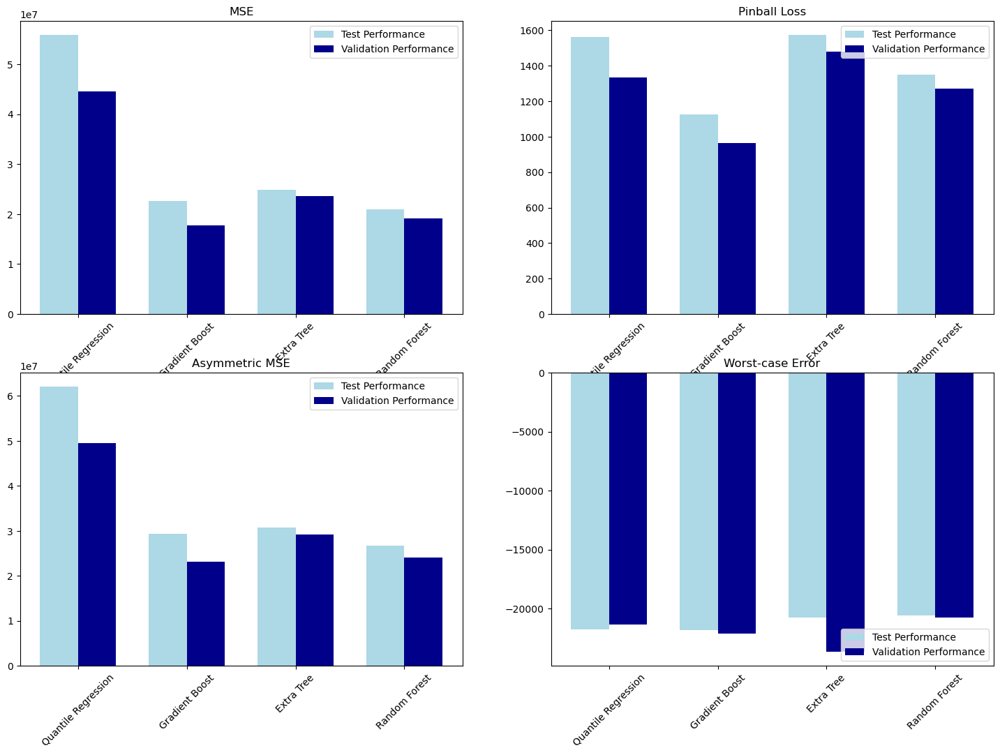

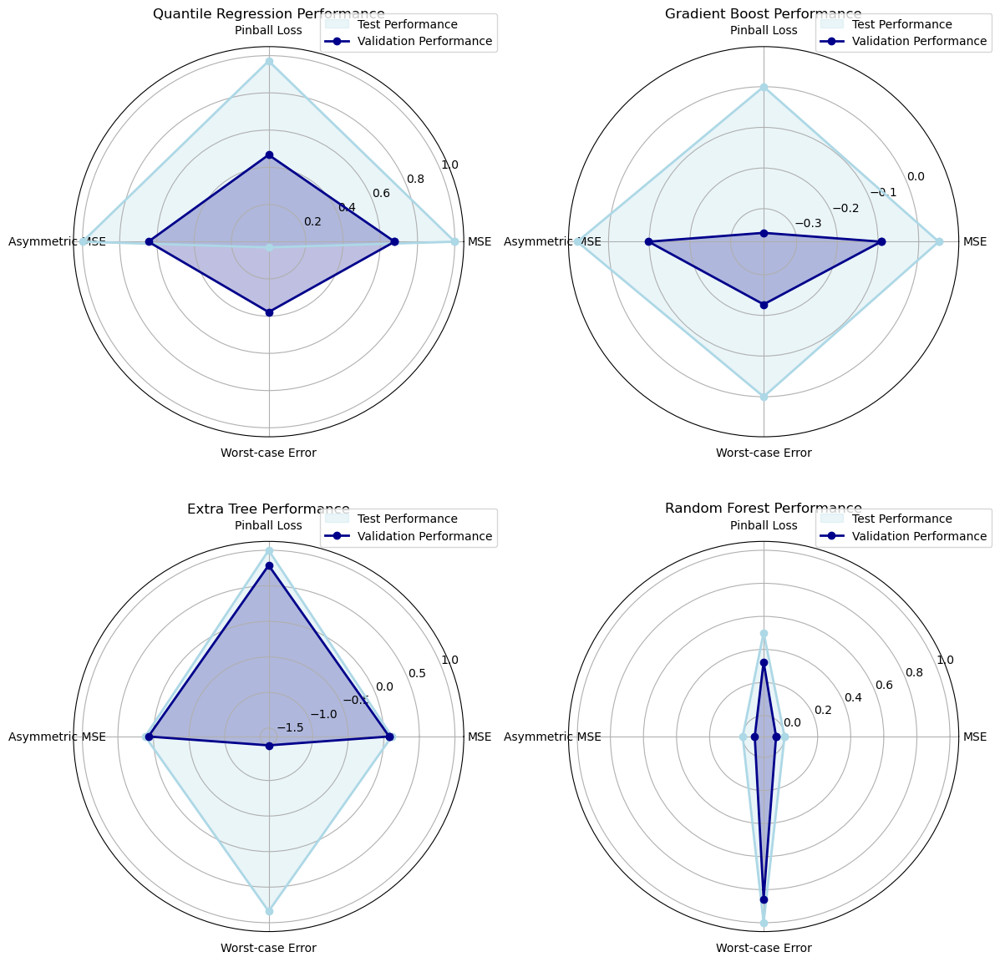

C:\Users\micha\AppData\Local\Temp\ipykernel_8944\4002149774.py:115: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  comparison_df = comparison_df.append({
C:\Users\micha\AppData\Local\Temp\ipykernel_8944\4002149774.py:115: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  comparison_df = comparison_df.append({
C:\Users\micha\AppData\Local\Temp\ipykernel_8944\4002149774.py:115: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  comparison_df = comparison_df.append({
C:\Users\micha\AppData\Local\Temp\ipykernel_8944\4002149774.py:115: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  comparison_df = comparison_df.append({
C:\Users\micha\AppData\Local\Tem

,Model,Metric,Test Performance,Validation Performance,Difference,Significance
0,Quantile Regression,MSE,5.582958e+07,4.455532e+07,1.127425e+07,NaN
1,Quantile Regression,Pinball Loss,1.560177e+03,1.333509e+03,2.266683e+02,NaN
2,Quantile Regression,Asymmetric MSE,6.207185e+07,4.954048e+07,1.253137e+07,NaN
3,Quantile Regression,Worst-case Error,-2.176929e+04,-2.133768e+04,-4.316079e+02,NaN
4,Gradient Boost,MSE,2.267120e+07,1.772346e+07,4.947732e+06,NaN
5,Gradient Boost,Pinball Loss,1.123650e+03,9.621126e+02,1.615370e+02,NaN
6,Gradient Boost,Asymmetric MSE,2.936914e+07,2.315770e+07,6.211444e+06,NaN
7,Gradient Boost,Worst-case Error,-2.180726e+04,-2.208898e+04,2.817265e+02,NaN
8,Extra Tree,MSE,2.486901e+07,2.359743e+07,1.271588e+06,NaN
9,Extra Tree,Pinball Loss,1.573098e+03,1.478058e+03,9.504033e+01,NaN


In [56]:
#quantile regression
# Fit the Quantile Regression model on the entire training dataset
X_train_val_sm_enc = sm.add_constant(pd.concat([X_train_enc, X_val_enc]))
y_train_val_enc = pd.concat([y_train_enc, y_val_enc])

quantile_regression_model = sm.QuantReg(y_train_val_enc, X_train_val_sm_enc).fit(q=0.75)

# Now predict on the test set
X_test_sm_enc = sm.add_constant(X_test_enc)  # Add constant to the test set
y_pred_qr_test = quantile_regression_model.predict(X_test_sm_enc)

# Predict on the test set for each model
y_pred_gbr_test = gbr_model.predict(X_test_enc)  # For gradient boost
y_pred_et_test = best_extra_trees.predict(X_test_enc)  # For extra trees
y_pred_rf_test = best_model_rf.predict(X_test_enc)  # For random forest

# Calculate performance metrics for each model on the test set
models_test = ['Quantile Regression', 'Gradient Boost', 'Extra Tree', 'Random Forest']
predictions_test = [y_pred_qr_test, y_pred_gbr_test, y_pred_et_test, y_pred_rf_test]

metrics_test = {model: {} for model in models_test}
for model, y_pred in zip(models_test, predictions_test):
    metrics_test[model]['MSE'] = mean_squared_error(y_test_enc, y_pred)
    metrics_test[model]['Pinball Loss'] = pinball_loss(y_test_enc, y_pred, 0.75)
    metrics_test[model]['Asymmetric MSE'] = asymmetric_mse(y_test_enc, y_pred, 1.33)
    metrics_test[model]['Worst-case Error'] = worst_case_error(y_test_enc, y_pred)

# Convert metrics dictionary to DataFrame for easier processing
metrics_df_test = pd.DataFrame(metrics_test).T

# Normalize the metrics for radar chart
scaler = MinMaxScaler()
normalized_metrics_test = scaler.fit_transform(metrics_df_test)
normalized_metrics_df_test = pd.DataFrame(normalized_metrics_test, index=metrics_df_test.index, columns=metrics_df_test.columns)

models = ['Quantile Regression', 'Gradient Boost', 'Extra Tree', 'Random Forest']

# Bar Chart Visualization
fig, axs = plt.subplots(2, 2, figsize=(18, 12))
metrics_list = ['MSE', 'Pinball Loss', 'Asymmetric MSE', 'Worst-case Error']

for i, metric in enumerate(metrics_list):
    ax = axs[i // 2, i % 2]
    values = [metrics_test[model][metric] for model in models_test]
    values_tuned = [metrics_tuned[model][metric] for model in models]
    
    #
    bars_test = ax.bar(indices, values, bar_width, label='Test Performance', color='lightblue')
    bars_tuned = ax.bar([index + bar_width for index in indices], values_tuned, bar_width, label='Validation Performance', color='darkblue')
    
                    
    ax.set_title(metric)
    ax.set_xticks([index + bar_width / 2 for index in indices])
    ax.set_xticklabels(models, rotation=45)
    ax.legend()

###    
# Convert the dictionaries to DataFrames
metrics_df_test = pd.DataFrame(metrics_test)
metrics_df_tuned = pd.DataFrame(metrics_tuned)  # Only if you have this data

# Transpose the DataFrame to make metrics as columns
metrics_df_test_transposed = pd.DataFrame(metrics_test).T

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Normalize all columns (metrics)
normalized_array = scaler.fit_transform(metrics_df_test_transposed)


# Normalize all columns (metrics)
normalized_metrics_df_test = pd.DataFrame(metrics_df_test_transposed, columns=metrics_df_test_transposed.columns)

# Transpose the DataFrame back to the original format
normalized_metrics_df_test = normalized_metrics_df_test.T

###  

# Radar chart subplot
fig_radar, axs_radar = plt.subplots(2, 2, figsize=(12, 12), subplot_kw=dict(polar=True))
angles = np.linspace(0, 2 * np.pi, len(metrics_list), endpoint=False).tolist()
angles += angles[:1]

for i, model in enumerate(models):
    ax = axs_radar[i // 2, i % 2]
    values_test = normalized_metrics_test[i].tolist()
    values_test += values_test[:1]
    values_tuned = normalized_metrics_tuned[i].tolist()
    values_tuned += values_tuned[:1]
    
    ax.plot(angles, values_test, 'o-', linewidth=2, color='lightblue')
    ax.fill(angles, values_test, alpha=0.25, label='Test Performance', color='lightblue')
    ax.plot(angles, values_tuned, 'o-', linewidth=2, label='Validation Performance', color='darkblue')
    ax.fill(angles, values_tuned, alpha=0.25, color='darkblue')
    
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metrics_list)
    ax.set_title(f"{model} Performance")
    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    
plt.tight_layout()
plt.show()

# Creating a DataFrame to compare the results
comparison_df = pd.DataFrame(columns=['Model', 'Metric', 'Test Performance', 'Validation Performance', 'Difference', 'Significance'])

# Populating the DataFrame
for model in models:
    for metric in metrics_list:
        test_perf = metrics_test[model][metric]
        val_perf = metrics_tuned[model][metric]
        difference = test_perf - val_perf

        comparison_df = comparison_df.append({
            'Model': model,
            'Metric': metric,
            'Test Performance': test_perf,
            'Validation Performance': val_perf,
            'Difference': difference,
        }, ignore_index=True)

# Displaying the DataFrame
comparison_df.head(16)

Overall our models performed worse for the test set comapred to the validation set. This was expected as the models were trained using the validation set and thus were made to accomodate the underlying data. However, we don't observe large differences in the perdiction performances suggesting that we were successful at mitigating the risk of overfitting. 